# Import libraries

In [2]:
pip install resampy

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 40.1 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [1]:
# Basic Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
pd.plotting.register_matplotlib_converters()
%matplotlib inline
import seaborn as sns

# Specific Libraries
import os
import librosa
import librosa.display
import IPython.display as ipd

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

from tqdm import tqdm, trange
from tqdm.auto import tqdm

import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense , Activation , Dropout
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Activation



In [3]:
sounds_df = pd.read_csv('/kaggle/input/urbansound8k/UrbanSound8K.csv')
sounds_df.head()

,slice_file_name,fsID,start,end,salience,fold,classID,class
0,100032-3-0-0.wav,100032,0.0,0.317551,1,5,3,dog_bark
1,100263-2-0-117.wav,100263,58.5,62.500000,1,5,2,children_playing
2,100263-2-0-121.wav,100263,60.5,64.500000,1,5,2,children_playing
3,100263-2-0-126.wav,100263,63.0,67.000000,1,5,2,children_playing
4,100263-2-0-137.wav,100263,68.5,72.500000,1,5,2,children_playing


In [4]:
sounds_freq = sounds_df['class'].value_counts().sort_values()
print(sounds_freq)

class
gun_shot             374
car_horn             429
siren                929
dog_bark            1000
street_music        1000
jackhammer          1000
air_conditioner     1000
children_playing    1000
drilling            1000
engine_idling       1000
Name: count, dtype: int64


# CNN Model

In [5]:
def get_cnn_model(input_shape,num_labels):
    model = Sequential()

    model.add(Conv1D(64, kernel_size=3, padding='same', input_shape=input_shape)) 
    model.add(Activation('relu'))
    model.add(MaxPooling1D(pool_size=2))  

    model.add(Conv1D(128, kernel_size=3, padding='same'))  
    model.add(Activation('relu'))
    model.add(MaxPooling1D(pool_size=2))

    model.add(Conv1D(256, kernel_size=3, padding='same'))  
    model.add(Activation('relu'))
    model.add(MaxPooling1D(pool_size=2))

    model.add(Flatten())

    model.add(Dense(256))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(128))
    model.add(Activation('relu'))
    model.add(Dropout(0.5))

    model.add(Dense(num_labels))
    model.add(Activation('softmax'))
    
    model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])
    
    return model

model = get_cnn_model((50,1),10)
model.summary()

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 50, 64)         │           256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 50, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 25, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 25, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 25, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 12, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 12, 256)        │        98,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 12, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 6, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1536)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       393,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,290 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_5 (Activation)       │ (None, 10)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 551,178 (2.10 MB)

 Trainable params: 551,178 (2.10 MB)

 Non-trainable params: 0 (0.00 B)

# Using MFCC, Building Model and Evaluating The Model

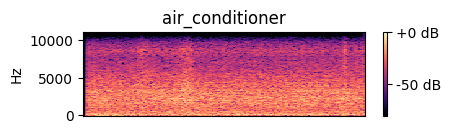

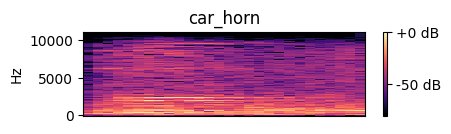

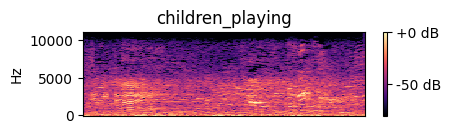

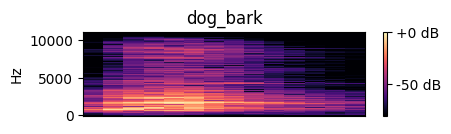

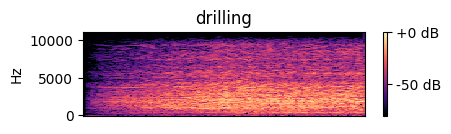

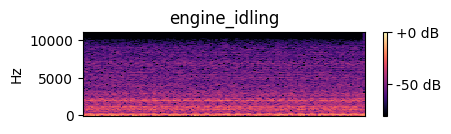

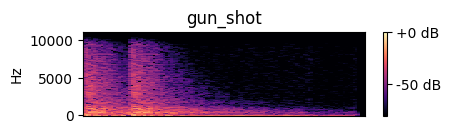

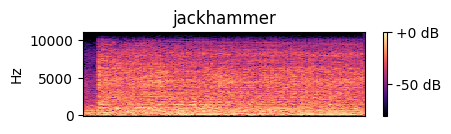

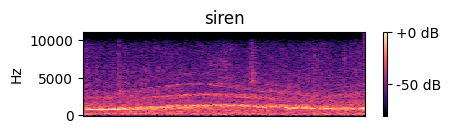

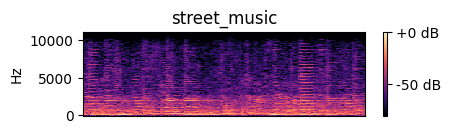

In [6]:
for i in range(10):
    wav = sounds_df[(sounds_df['classID']==i)].iloc[0]['slice_file_name']
    fold = sounds_df[(sounds_df['classID']==i)].iloc[0]['fold']
    tclass = sounds_df[(sounds_df['classID']==i)].iloc[0]['class']
    path = '../input/urbansound8k/fold' + str(fold) + '/' + str(wav)
    data, sampling_rate = librosa.load(path,res_type='kaiser_fast')
    plt.figure(figsize=(10, 5))
    D = librosa.amplitude_to_db(np.abs(librosa.stft(data)), ref=np.max)
    plt.subplot(4, 2, 1)
    librosa.display.specshow(D, y_axis='linear')
    plt.colorbar(format='%+2.0f dB')
    plt.title(tclass)

In [7]:
def features_extract(file):
    sample,sample_rate = librosa.load(file_name)
    feature = librosa.feature.mfcc(y=sample,sr=sample_rate,n_mfcc=50)
    scaled_feature = np.mean(feature.T,axis=0)
    return scaled_feature

extracted = []
path = '/kaggle/input/urbansound8k'

for index_num,row in tqdm(sounds_df.iterrows()):
    file_name = os.path.join(os.path.abspath(path),'fold'+str(row["fold"])+'/',str(row['slice_file_name'])) 
    final_class_labels = row['class']   
    data= features_extract(file_name)    
    extracted.append([data,final_class_labels])

0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(


In [8]:
ext_df = pd.DataFrame(extracted,columns=['feature','class'])
ext_df

,feature,class
0,"[-211.93698, 62.58122, -122.813156, -60.745296...",dog_bark
1,"[-417.00525, 99.336624, -42.995586, 51.073326,...",children_playing
2,"[-452.39316, 112.36253, -37.578075, 43.195866,...",children_playing
3,"[-406.47922, 91.19661, -25.043556, 42.784523, ...",children_playing
4,"[-439.63873, 103.86224, -42.658787, 50.690285,...",children_playing
...,...,...
8727,"[-391.3721, 125.362404, -40.634056, 25.899755,...",car_horn
8728,"[-339.42715, 76.4091, -35.309883, 41.98404, -2...",car_horn
8729,"[-297.31534, 102.09027, -36.75108, 26.81649, -...",car_horn
8730,"[-336.92386, 115.3139, -44.8471, 24.968985, -9...",car_horn


In [9]:
x = np.array(ext_df['feature'].tolist())
y = np.array(ext_df['class'].tolist())

In [10]:
le = LabelEncoder()
y = to_categorical(le.fit_transform(y))

In [11]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)

print("Number of training samples = ", x_train.shape[0])
print("Number of testing samples = ",x_test.shape[0])

Number of training samples =  6985
Number of testing samples =  1747


In [12]:
x_train = x_train.reshape(6985,50,1)
x_train.shape

(6985, 50, 1)

In [13]:
model = get_cnn_model((x_train.shape[1],x_train.shape[2]),10)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [15]:
model.fit(
          x_train, 
          y_train, 
          batch_size=32, 
          epochs=25,
          validation_data=(x_test, y_test),
         )

Epoch 1/25


I0000 00:00:1727985084.485455     117 service.cc:145] XLA service 0x7e28c8010380 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1727985084.485511     117 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 67/219 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.1433 - loss: 2.9950

I0000 00:00:1727985089.666641     117 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


219/219 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - accuracy: 0.1932 - loss: 2.4745 - val_accuracy: 0.4974 - val_loss: 1.5338
Epoch 2/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4541 - loss: 1.5874 - val_accuracy: 0.6125 - val_loss: 1.1110
Epoch 3/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5515 - loss: 1.3099 - val_accuracy: 0.7310 - val_loss: 0.8640
Epoch 4/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6646 - loss: 1.0121 - val_accuracy: 0.7539 - val_loss: 0.7756
Epoch 5/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7142 - loss: 0.8665 - val_accuracy: 0.8094 - val_loss: 0.6245
Epoch 6/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7699 - loss: 0.7058 - val_accuracy: 0.8277 - val_loss: 0.5667
Epoch 7/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8045 - loss: 0.5895 - val_accuracy: 0.8386 - val_loss: 0.5515
Epoch 8/25
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8456 - loss: 0.4922 - val_accuracy: 0.8724 - va

In [16]:
def extract_feature(file_name):
    audio_data, sample_rate = librosa.load(file_name) 
    fea = librosa.feature.mfcc(y=audio_data, sr=sample_rate, n_mfcc=50)
    scaled = np.mean(fea.T,axis=0)
    return np.array([scaled])

In [17]:
def print_prediction(file_name):
    pred_fea = extract_feature(file_name) 
    pred_vector = np.argmax(model.predict(pred_fea), axis=-1)
    pred_class = le.inverse_transform(pred_vector)
    print("The predicted class is:", pred_class[0], '\n')

In [18]:
print_prediction('../input/urbansound8k/fold2/100652-3-0-2.wav')
ipd.Audio('../input/urbansound8k/fold2/100652-3-0-2.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
The predicted class is: dog_bark 



In [19]:
print_prediction('../input/urbansound8k/fold5/100263-2-0-137.wav')
ipd.Audio('../input/urbansound8k/fold5/100263-2-0-137.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
The predicted class is: children_playing 



In [20]:
print_prediction('../input/urbansound8k/fold7/102853-8-0-2.wav')
ipd.Audio('../input/urbansound8k/fold7/102853-8-0-2.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The predicted class is: siren 



In [21]:
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9207 - loss: 0.4915
Test Accuracy: 91.01%


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Classification Report:

                  precision    recall  f1-score   support

 air_conditioner       0.94      0.97      0.96       203
        car_horn       0.94      0.91      0.92        86
children_playing       0.81      0.90      0.85       183
        dog_bark       0.87      0.86      0.86       201
        drilling       0.92      0.86      0.89       206
   engine_idling       0.96      0.97      0.97       193
        gun_shot       0.86      0.83      0.85        72
      jackhammer       0.96      0.95      0.95       208
           siren       0.95      0.96      0.95       165
    street_music       0.88      0.86      0.87       230

        accuracy                           0.91      1747
       macro avg       0.91      0.91      0.91      1747
    weighted avg       0.91      0.91      0.91      1747



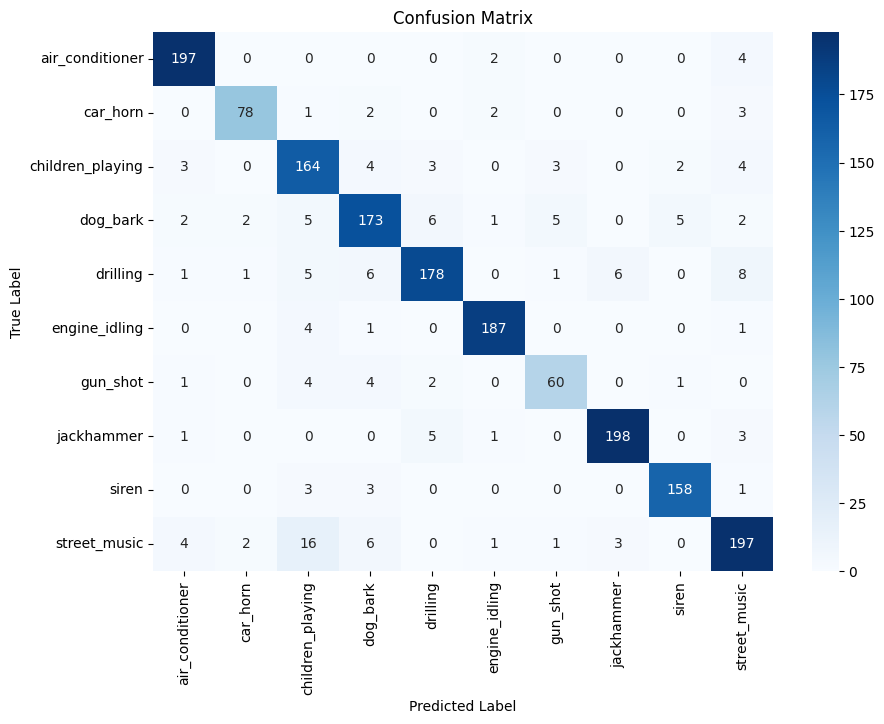

In [22]:
y_pred = model.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

class_names = ['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 'drilling', 
               'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music']

print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()


# Using Gammatone, Building Model and Evaluating The Model

In [23]:
pip install https://github.com/Lightning-Sandbox/gammatone/archive/refs/heads/main.zip

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


     \ 59.3 MB 56.8 MB/s 0:00:03m
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for Gammatone: filename=Gammatone-1.0.3-py3-none-any.whl size=15020 sha256=8f3240c7d78cb3c94cf97cf866d6a1c6980d5cf3c9480aeea776dac1b876d59b
  Stored in directory: /tmp/pip-ephem-wheel-cache-jqxu5b7l/wheels/57/4e/24/d4dcbce28567bec33acbbcc94f3559480e6367d62d9407cb3a
Successfully built Gammatone
Note: you may need to restart the kernel to use updated packages.


In [24]:
from gammatone.gtgram import gtgram

In [26]:
n_channels = 64 
window_time = 0.02 
hop_time = 0.01   
f_min = 50 

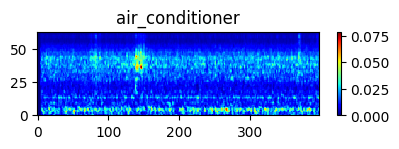

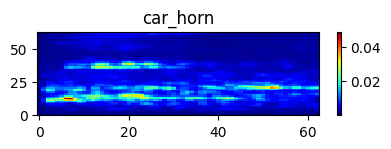

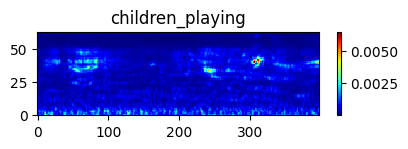

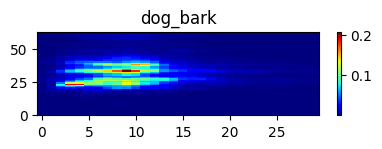

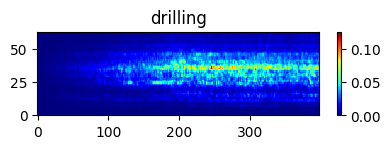

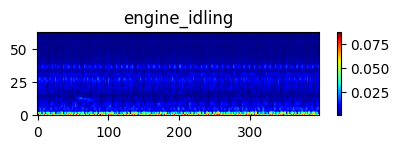

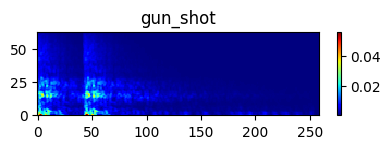

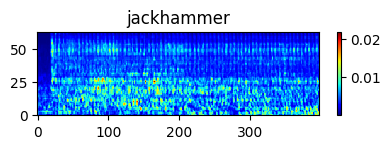

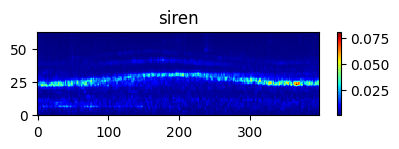

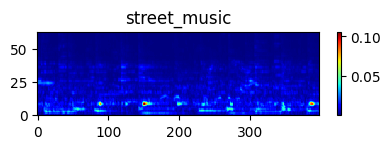

In [27]:
for i in range(10):
    wav = sounds_df[(sounds_df['classID']==i)].iloc[0]['slice_file_name']
    fold = sounds_df[(sounds_df['classID']==i)].iloc[0]['fold']
    tclass = sounds_df[(sounds_df['classID']==i)].iloc[0]['class']
    path = '../input/urbansound8k/fold' + str(fold) + '/' + str(wav)
    data, sampling_rate = librosa.load(path)
    plt.figure(figsize=(10, 5))
    gtgram_result = gtgram(data, sampling_rate, window_time, hop_time, n_channels, f_min)
    plt.subplot(4, 2, 1)
    plt.imshow(gtgram_result, aspect='auto', origin='lower', cmap='jet', interpolation='nearest')
    plt.colorbar()
    plt.title(tclass)

In [29]:
def features_extract(file):
    sample,sample_rate = librosa.load(file_name,res_type='kaiser_fast')
    gtgram_result = gtgram(sample, sample_rate, window_time, hop_time, n_channels, f_min)
    scaled_feature = np.mean(gtgram_result.T,axis=0)
    return scaled_feature

extracted = []
path = '/kaggle/input/urbansound8k'

for index_num,row in tqdm(sounds_df.iterrows()):
    file_name = os.path.join(os.path.abspath(path),'fold'+str(row["fold"])+'/',str(row['slice_file_name'])) 
    final_class_labels = row['class']   
    data= features_extract(file_name)    
    extracted.append([data,final_class_labels])

0it [00:00, ?it/s]

In [30]:
ext_df = pd.DataFrame(extracted,columns=['feature','class'])
ext_df

,feature,class
0,"[7.251351945081343e-05, 9.246782621000426e-05,...",dog_bark
1,"[0.001274107980210895, 0.0011766722845592238, ...",children_playing
2,"[0.000955279661609869, 0.0010299420697434877, ...",children_playing
3,"[0.000988144649602606, 0.0012175872606908506, ...",children_playing
4,"[0.0011564560097281614, 0.0009912560439490378,...",children_playing
...,...,...
8727,"[0.0010628909686190258, 0.001000631019348801, ...",car_horn
8728,"[0.000786512155033073, 0.0008224184052722948, ...",car_horn
8729,"[0.0013432820294152915, 0.001535990409362793, ...",car_horn
8730,"[0.0015132129852541535, 0.0016286335174353248,...",car_horn


In [31]:
x = np.array(ext_df['feature'].tolist())
y = np.array(ext_df['class'].tolist())

In [32]:
le = LabelEncoder()
y = to_categorical(le.fit_transform(y))

In [33]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)

print("Number of training samples = ", x_train.shape[0])
print("Number of testing samples = ",x_test.shape[0])

Number of training samples =  6985
Number of testing samples =  1747


In [35]:
x_train = x_train.reshape(6985,64,1)
x_train.shape

(6985, 64, 1)

In [36]:
model = get_cnn_model((x_train.shape[1],x_train.shape[2]),10)

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [56]:
model.fit(
          x_train, 
          y_train, 
          batch_size=32, 
          epochs=250,
          validation_data=(x_test, y_test),
         )

Epoch 1/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9639 - loss: 0.1088 - val_accuracy: 0.9015 - val_loss: 0.8054
Epoch 2/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9667 - loss: 0.0909 - val_accuracy: 0.9056 - val_loss: 0.8909
Epoch 3/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9665 - loss: 0.1006 - val_accuracy: 0.9010 - val_loss: 0.8739
Epoch 4/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9641 - loss: 0.1016 - val_accuracy: 0.8998 - val_loss: 0.7702
Epoch 5/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9665 - loss: 0.0987 - val_accuracy: 0.8970 - val_loss: 0.9016
Epoch 6/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9671 - loss: 0.0952 - val_accuracy: 0.8935 - val_loss: 0.8758
Epoch 7/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9650 - loss: 0.1096 - val_accuracy: 0.8993 - val_loss: 0.7955
Epoch 8/250
219/219 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9717 - loss: 0.0879 - val_accu

In [53]:
def extract_feature(file_name):
    sample, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    gtgram_result = gtgram(sample, sample_rate, window_time, hop_time, n_channels, f_min)
    scaled = np.mean(gtgram_result.T,axis=0)
    return np.array([scaled])

In [46]:
def print_prediction(file_name):
    pred_fea = extract_feature(file_name) 
    pred_vector = np.argmax(model.predict(pred_fea), axis=-1)
    pred_class = le.inverse_transform(pred_vector)
    print("The predicted class is:", pred_class[0], '\n')

In [47]:
print_prediction('../input/urbansound8k/fold2/100652-3-0-2.wav')
ipd.Audio('../input/urbansound8k/fold2/100652-3-0-2.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
The predicted class is: dog_bark 



In [48]:
print_prediction('../input/urbansound8k/fold5/100263-2-0-137.wav')
ipd.Audio('../input/urbansound8k/fold5/100263-2-0-137.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The predicted class is: children_playing 



In [49]:
print_prediction('../input/urbansound8k/fold7/102853-8-0-2.wav')
ipd.Audio('../input/urbansound8k/fold7/102853-8-0-2.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
The predicted class is: siren 



In [57]:
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9012 - loss: 1.1525
Test Accuracy: 90.04%


55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Classification Report:

                  precision    recall  f1-score   support

 air_conditioner       0.96      0.95      0.95       203
        car_horn       0.89      0.84      0.86        86
children_playing       0.79      0.85      0.82       183
        dog_bark       0.86      0.89      0.87       201
        drilling       0.93      0.86      0.89       206
   engine_idling       0.94      0.99      0.96       193
        gun_shot       0.94      0.83      0.88        72
      jackhammer       0.96      0.93      0.95       208
           siren       0.94      0.98      0.96       165
    street_music       0.84      0.83      0.83       230

        accuracy                           0.90      1747
       macro avg       0.90      0.89      0.90      1747
    weighted avg       0.90      0.90      0.90      1747



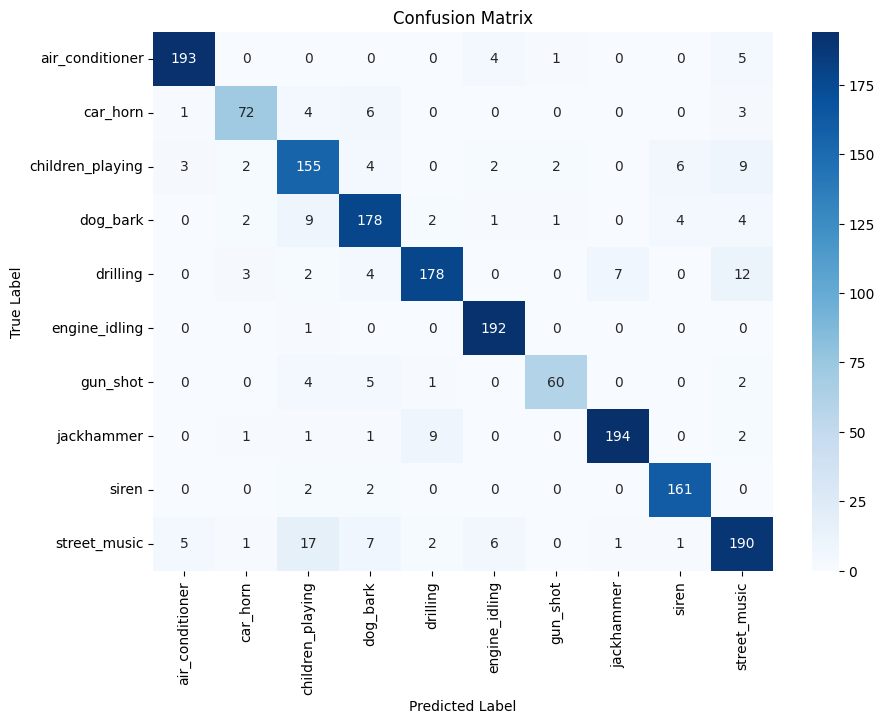

In [58]:
y_pred = model.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

class_names = ['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 'drilling', 
               'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music']

print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

# Using Short-Time Fourier Transform (STFT), Building Model and Evaluating The Model

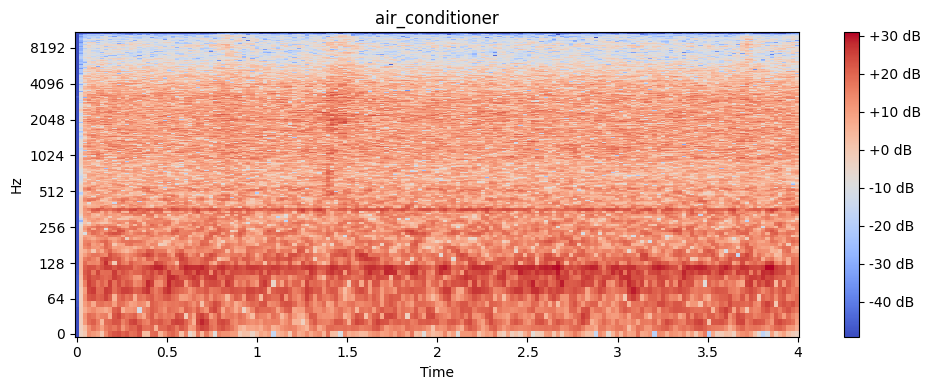

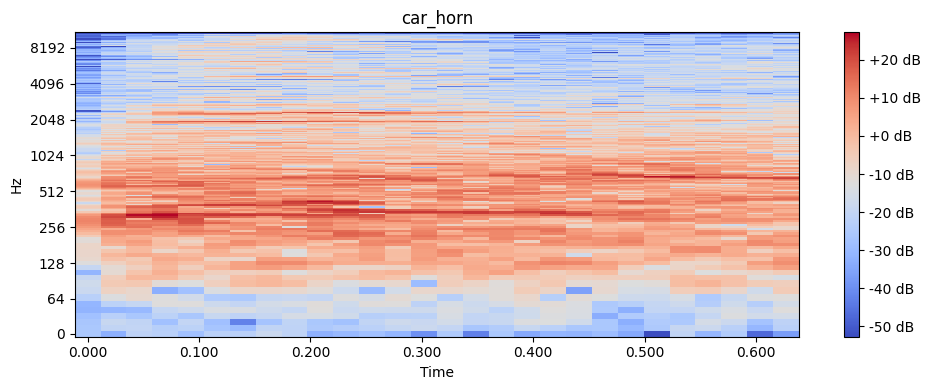

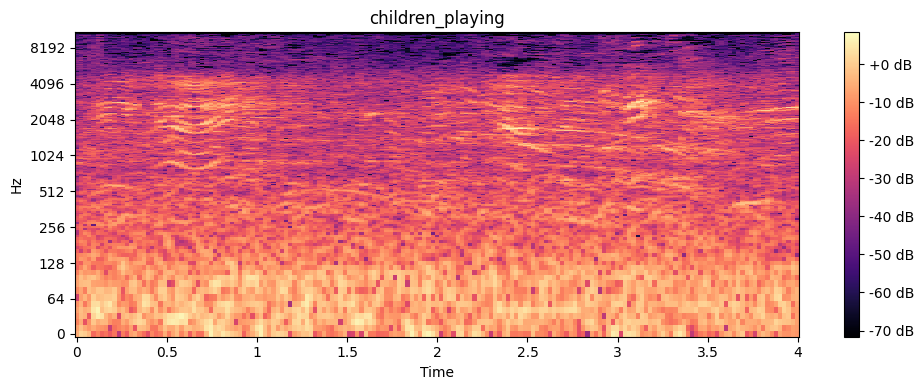

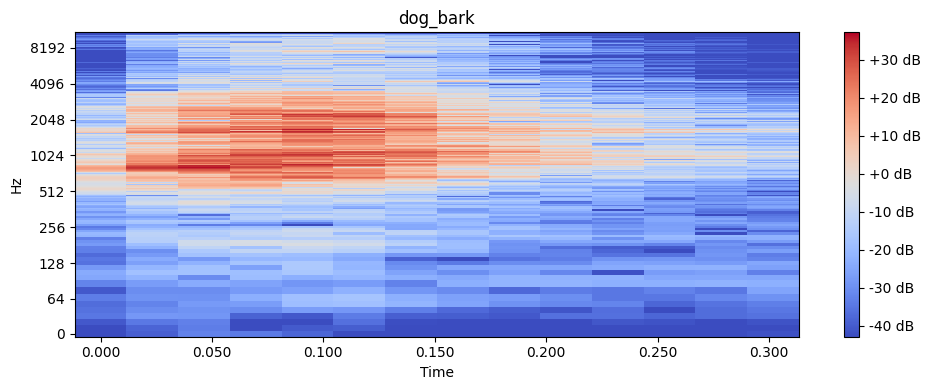

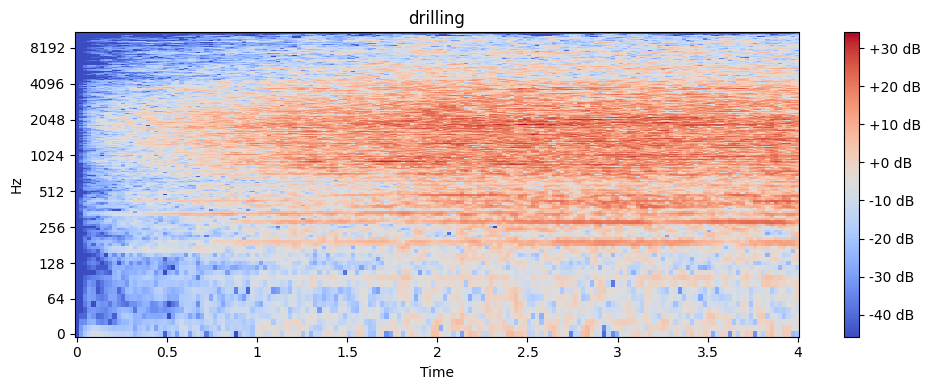

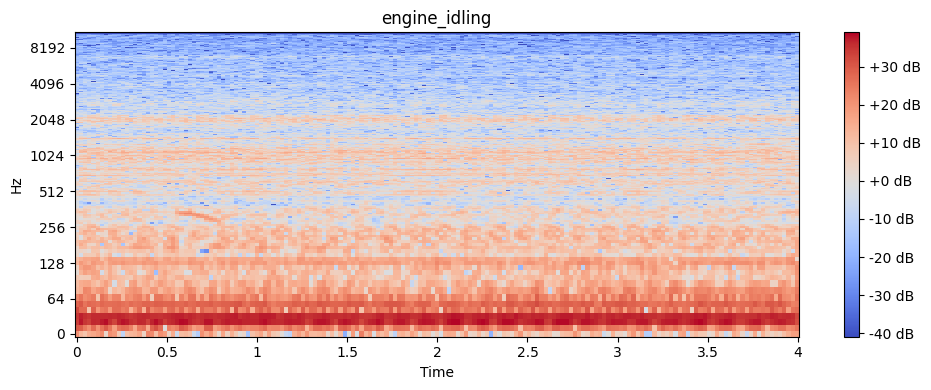

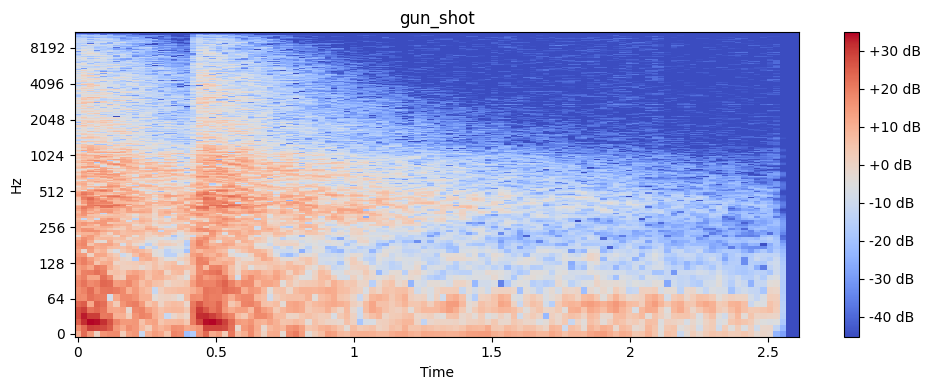

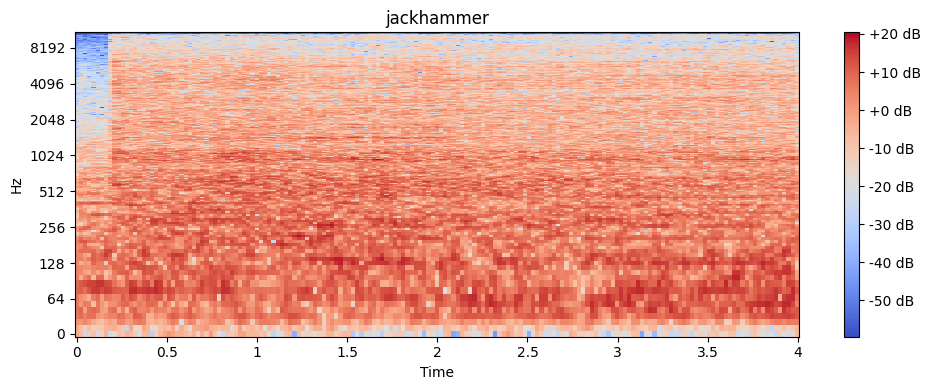

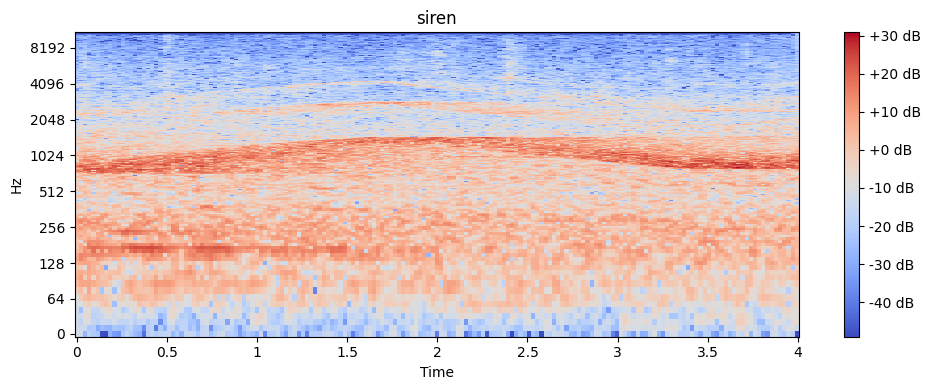

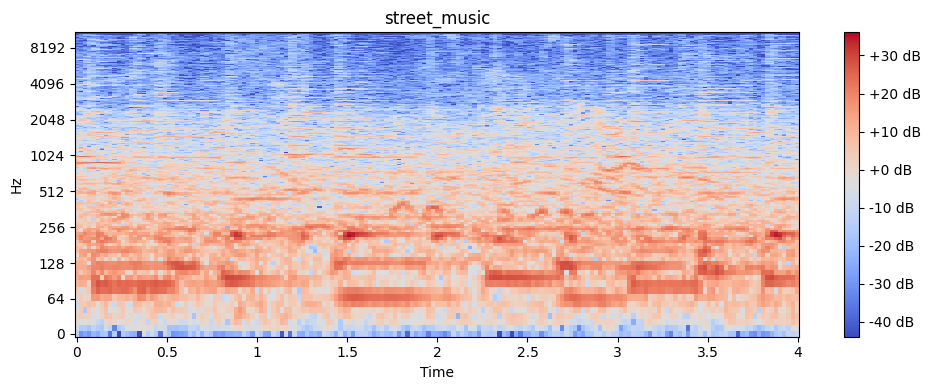

In [60]:
for i in range(10):
    wav = sounds_df[(sounds_df['classID']==i)].iloc[0]['slice_file_name']
    fold = sounds_df[(sounds_df['classID']==i)].iloc[0]['fold']
    tclass = sounds_df[(sounds_df['classID']==i)].iloc[0]['class']
    path = '../input/urbansound8k/fold' + str(fold) + '/' + str(wav)
    data, sampling_rate = librosa.load(path)
    stft = librosa.stft(data)
    stft_db = librosa.amplitude_to_db(abs(stft))
    
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(stft_db, sr=sampling_rate, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(tclass)
    plt.tight_layout()
    plt.show()

In [61]:
def features_extract(file):
    sample,sample_rate = librosa.load(file_name,res_type='kaiser_fast')
    stft = librosa.stft(sample)
    stft_db = librosa.amplitude_to_db(abs(stft))
    scaled_feature = np.mean(stft_db.T,axis=0)
    return scaled_feature

extracted = []
path = '/kaggle/input/urbansound8k'

for index_num,row in tqdm(sounds_df.iterrows()):
    file_name = os.path.join(os.path.abspath(path),'fold'+str(row["fold"])+'/',str(row['slice_file_name'])) 
    final_class_labels = row['class']   
    data= features_extract(file_name)    
    extracted.append([data,final_class_labels])

0it [00:00, ?it/s]

/opt/conda/lib/python3.10/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1323
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1103
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=1523
  warnings.warn(


In [62]:
ext_df = pd.DataFrame(extracted,columns=['feature','class'])
ext_df

,feature,class
0,"[-40.83978, -41.44077, -40.517357, -36.1953, -...",dog_bark
1,"[-9.301275, -6.286056, -5.3966017, -5.6071935,...",children_playing
2,"[-10.994256, -7.134338, -7.4246573, -6.7560635...",children_playing
3,"[-11.190687, -10.497624, -9.389264, -6.4334574...",children_playing
4,"[-10.3777485, -8.573733, -6.012239, -0.6560418...",children_playing
...,...,...
8727,"[-20.513044, -14.285513, -11.800873, -9.686951...",car_horn
8728,"[-17.265518, -16.11328, -14.099293, -11.671956...",car_horn
8729,"[-18.923992, -14.746086, -11.673852, -10.05608...",car_horn
8730,"[-22.353323, -14.269679, -7.8001065, -8.730278...",car_horn


In [63]:
x = np.array(ext_df['feature'].tolist())
y = np.array(ext_df['class'].tolist())

In [64]:
le = LabelEncoder()
y = to_categorical(le.fit_transform(y))

In [65]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state = 42)

print("Number of training samples = ", x_train.shape[0])
print("Number of testing samples = ",x_test.shape[0])

Number of training samples =  6985
Number of testing samples =  1747


In [67]:
x_train = x_train.reshape(6985,x_train.shape[1],1)
x_train.shape

(6985, 1025, 1)

In [74]:
model = get_cnn_model((x_train.shape[1],x_train.shape[2]),10)

In [75]:
model.fit(
          x_train, 
          y_train, 
          batch_size=32, 
          epochs=50,
          validation_data=(x_test, y_test),
         )

Epoch 1/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - accuracy: 0.1767 - loss: 3.5157 - val_accuracy: 0.5398 - val_loss: 1.4777
Epoch 2/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.4298 - loss: 1.5880 - val_accuracy: 0.7081 - val_loss: 1.0131
Epoch 3/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.5875 - loss: 1.1988 - val_accuracy: 0.7802 - val_loss: 0.7675
Epoch 4/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.6950 - loss: 0.9363 - val_accuracy: 0.8145 - val_loss: 0.6008
Epoch 5/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7230 - loss: 0.8384 - val_accuracy: 0.8535 - val_loss: 0.5128
Epoch 6/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.7940 - loss: 0.6473 - val_accuracy: 0.8472 - val_loss: 0.4931
Epoch 7/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.8093 - loss: 0.5808 - val_accuracy: 0.8729 - val_loss: 0.4470
Epoch 8/50
219/219 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.8425 - loss: 0.5032 - val_acc

In [80]:
def extract_feature(file_name):
    sample, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
    stft = librosa.stft(sample)
    stft_db = librosa.amplitude_to_db(abs(stft))
    scaled = np.mean(stft_db.T,axis=0)
    return np.array([scaled])

In [78]:
def print_prediction(file_name):
    pred_fea = extract_feature(file_name) 
    pred_vector = np.argmax(model.predict(pred_fea), axis=-1)
    pred_class = le.inverse_transform(pred_vector)
    print("The predicted class is:", pred_class[0], '\n')

In [81]:
print_prediction('../input/urbansound8k/fold2/100652-3-0-2.wav')
ipd.Audio('../input/urbansound8k/fold2/100652-3-0-2.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
The predicted class is: dog_bark 



In [82]:
print_prediction('../input/urbansound8k/fold5/100263-2-0-137.wav')
ipd.Audio('../input/urbansound8k/fold5/100263-2-0-137.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The predicted class is: children_playing 



In [83]:
print_prediction('../input/urbansound8k/fold7/102853-8-0-2.wav')
ipd.Audio('../input/urbansound8k/fold7/102853-8-0-2.wav')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
The predicted class is: siren 



In [84]:
test_loss, test_accuracy = model.evaluate(x_test, y_test)
print(f"Test Accuracy: {test_accuracy*100:.2f}%")

55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.9142 - loss: 0.4281
Test Accuracy: 92.10%


55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Classification Report:

                  precision    recall  f1-score   support

 air_conditioner       0.97      0.93      0.95       203
        car_horn       0.96      0.92      0.94        86
children_playing       0.83      0.95      0.89       183
        dog_bark       0.89      0.80      0.84       201
        drilling       0.93      0.89      0.91       206
   engine_idling       0.95      0.98      0.97       193
        gun_shot       0.88      0.90      0.89        72
      jackhammer       0.92      0.97      0.94       208
           siren       0.95      0.98      0.96       165
    street_music       0.92      0.90      0.91       230

        accuracy                           0.92      1747
       macro avg       0.92      0.92      0.92      1747
    weighted avg       0.92      0.92      0.92      1747



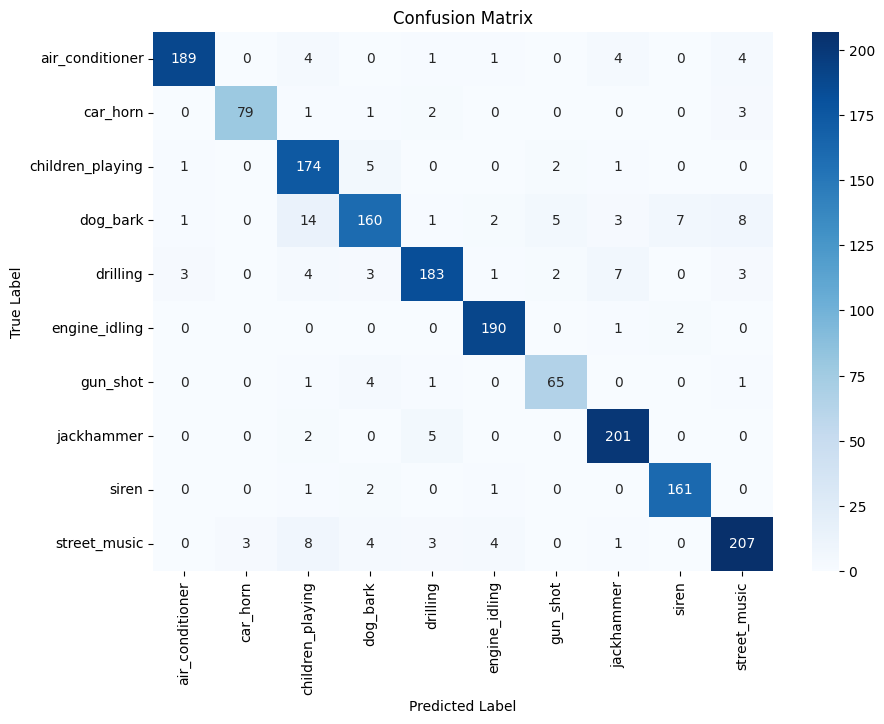

In [85]:
y_pred = model.predict(x_test)

y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

conf_matrix = confusion_matrix(y_true, y_pred_classes)

class_names = ['air_conditioner', 'car_horn', 'children_playing', 'dog_bark', 'drilling', 
               'engine_idling', 'gun_shot', 'jackhammer', 'siren', 'street_music']

print("Classification Report:\n")
print(classification_report(y_true, y_pred_classes, target_names=class_names))

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()